In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go  # Import Plotly graph objects
import plotly.express as px  # Import Plotly Express

In [2]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('display.max_colwidth',None)

In [3]:
# Mounting google drive account in colab

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Capstone_Project_REAL_ESTATE/gurgaon_real_estate_cleaned_ver3.csv').drop_duplicates()

In [ ]:
df.shape

(3808, 23)

In [ ]:
df.head()

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_builtup_area,builtup_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,dlf regal gardens,sector 90,1.26,7403.0,1702.0,super built up area 1702(158.12 sq.m.)carpet area: 1500(139.35 sq.m.),3,3,3,6.0,North-East,Relatively New,1702.0,NaN,1500.0,0,0,0,0,1,1,28
1,flat,tulip violet,sector 69,1.72,8730.0,1970.0,super built up area 1970(183.02 sq.m.),4,4,1,12.0,North-East,Relatively New,1970.0,NaN,NaN,0,0,0,0,0,0,86
2,flat,experion the heartsong,sector 108,2.28,8204.0,2779.0,super built up area 2779(258.18 sq.m.),4,5,3+,8.0,North,Relatively New,2779.0,NaN,NaN,0,0,0,0,0,0,101
3,flat,signature global city 92,sector 92,0.78,8047.0,969.0,super built up area 1197(111.2 sq.m.),2,2,2,2.0,not available,New Property,1197.0,NaN,NaN,0,0,0,0,0,1,47
4,flat,puri diplomatic greens,sector 111,3.45,11694.0,2950.0,super built up area 2950(274.06 sq.m.),4,5,3+,10.0,North,Relatively New,2949.0,NaN,NaN,0,1,0,0,0,0,101


In [ ]:
#outliers in price

In [ ]:
fig = px.histogram(df['price'],nbins=50,marginal='rug')
fig.update_layout(bargap=0.05)

In [ ]:
import plotly.figure_factory as ff
fig1 = ff.create_distplot([list(df['price'])],['distplot'])
#fig.update_traces(autobinx=True, selector={'type':'histogram'})
fig1.show()

In [ ]:
fig = px.box(df['price'],orientation='h')
fig.show()

In [ ]:
# Calculate the IQR for the 'price' column
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df['price'] < lower_bound) | (df['price'] > upper_bound)]

# Displaying the number of outliers and some statistics
num_outliers = outliers.shape[0]
outliers_price_stats = outliers['price'].describe()

num_outliers, outliers_price_stats

(437,
 count    437.000000
 mean       9.179611
 std        4.052057
 min        5.400000
 25%        6.400000
 50%        8.000000
 75%       10.550000
 max       31.500000
 Name: price, dtype: float64)

In [ ]:
outliers.sort_values(by='price',ascending=False).head(100)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_builtup_area,builtup_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
183,house,arjun marg/ sector- 26 phase- 1/ golf course road,sector 26,31.50,35000.0,9000.0,plot area 1000(836.13 sq.m.),7,9,3+,3.0,North-East,Moderately Old,NaN,8997.0,NaN,1,1,1,1,0,2,74
3383,house,independent,sector 43,27.50,24366.0,11286.0,plot area 1254(1048.5 sq.m.),6,7,3+,3.0,North-East,Relatively New,NaN,11282.0,NaN,1,1,0,1,1,1,42
2459,house,dlf city plots,sector 26,26.00,57206.0,4545.0,plot area 505(422.24 sq.m.),6,7,3+,2.0,North-East,New Property,NaN,4544.0,NaN,1,1,0,1,1,1,138
1596,house,independent,sector 26,26.00,82540.0,3150.0,plot area 402(336.12 sq.m.)built up area: 400(334.45 sq.m.)carpet area: 350(292.64 sq.m.),16,16,3+,4.0,North-West,New Property,NaN,3617.0,3149.0,1,1,1,1,0,2,72
446,house,suncity township,sector 54,25.00,31111.0,8036.0,plot area 1000(836.13 sq.m.),4,4,3+,2.0,North,Moderately Old,NaN,8997.0,NaN,1,1,1,1,0,0,0
1947,house,emaar the palm springs,sector 54,24.00,600000.0,400.0,plot area 400(37.16 sq.m.),5,5,2,1.0,North-East,Old Property,NaN,400.0,NaN,1,1,0,1,0,1,122
2258,house,independent,sector 26,23.00,25556.0,9000.0,plot area 1000(836.13 sq.m.),4,4,3+,2.0,South-West,Relatively New,NaN,8997.0,NaN,1,1,1,1,0,1,145
1568,house,vipul tatvam villa,sector 48,22.00,26667.0,8250.0,plot area 1000(836.13 sq.m.),5,6,3,3.0,not available,Moderately Old,NaN,8997.0,NaN,0,1,0,0,0,0,54
1223,house,luxury dlf city floors,sector 26,20.00,48889.0,4091.0,plot area 500(418.06 sq.m.),16,16,3+,4.0,not available,New Property,NaN,4499.0,NaN,0,1,0,0,0,1,31
2344,house,independent,sector 26,20.00,44444.0,4500.0,plot area 500(418.06 sq.m.),5,7,3+,3.0,West,Relatively New,NaN,4499.0,NaN,0,1,0,1,0,2,97


In [ ]:
df.loc[1947,['area','builtup_area']] = 400*10.76 #rectifying data error

In [ ]:
df.loc[1947,'price_per_sqft'] = 240000000/(df.loc[1947,'area']) #rectifying data error

In [ ]:
df.loc[2740,'area'] = 4517 #rectifying data error

In [ ]:
df.loc[2740,'price_per_sqft'] = 184000000/(df.loc[2740,'area']) #rectifying data error

In [ ]:
df.loc[2740,'carpet_area'] = np.nan #rectifying data error

In [ ]:
df.loc[3408,'builtup_area'] = 10000 #rectifying data error

In [ ]:
df.iloc[3408,:]

property_type                                                             house
society                                                             independent
sector                                                                sector 26
price                                                                     18.25
price_per_sqft                                                          18250.0
area                                                                    10000.0
areaWithType          plot area 550(51.1 sq.m.)carpet area: 10000(929.03 sq.m.)
bedRoom                                                                       7
bathroom                                                                      9
balcony                                                                      3+
floorNum                                                                    4.0
facing                                                                     East
agePossession                           

In [ ]:
# outliers in price per sqft

<ipython-input-20-03a688873ccd>:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='price_per_sqft', ylabel='Density'>

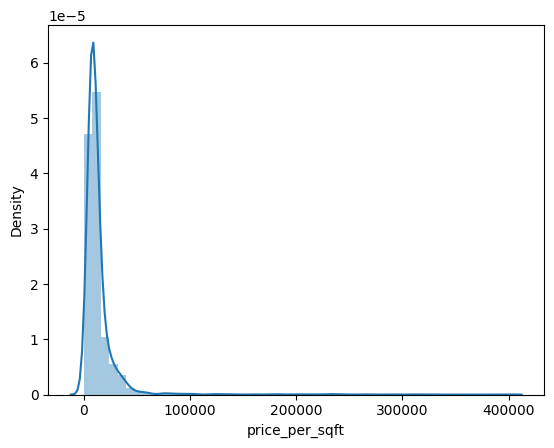

In [ ]:
sns.distplot(df['price_per_sqft'])

In [ ]:
fig = px.histogram(df['price_per_sqft'],nbins=40,marginal='rug')
fig.update_layout(bargap=0.05)

In [ ]:
fig = px.box(df['price_per_sqft'],orientation='h')
fig.show()

In [ ]:

Q1 = df['price_per_sqft'].quantile(0.25)
Q3 = df['price_per_sqft'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers_sqft = df[(df['price_per_sqft'] < lower_bound) | (df['price_per_sqft'] > upper_bound)]

# Displaying the number of outliers and some statistics
num_outliers = outliers_sqft.shape[0]
outliers_sqft_stats = outliers_sqft['price_per_sqft'].describe()

num_outliers, outliers_sqft_stats

(371,
 count       371.000000
 mean      52314.652515
 std       53565.841141
 min       24500.000000
 25%       28274.500000
 50%       33951.000000
 75%       43899.500000
 max      400000.000000
 Name: price_per_sqft, dtype: float64)

In [ ]:
df['price_per_sqft'].min()

5.0

In [ ]:
df_irr1 = df.sort_values(by='price_per_sqft',ascending=True).head(50).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

In [ ]:
df_irr1[df_irr1['price'] < 0.60]

#2256,1642,3125 area - divide by 1000
#3065,2509,361,2545,2789,438,175 area - divide by 100
#1706,3793 area - divide by 10

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
2256,flat,ramsons kshitij,sector 95,0.31,5.0,620000.0,carpet area: 607936 (56479.1 sq.m.),2,NaN,NaN,607716.0
1642,flat,signature the roselia,sector 95,0.45,7.0,642857.0,carpet area: 569243 (52884.41 sq.m.),2,NaN,NaN,569037.0
3125,flat,signature global solera 2,sector 107,0.51,9.0,566667.0,carpet area: 514396 (47788.95 sq.m.),2,NaN,NaN,514210.0
3065,flat,ramsons kshitij,sector 95,0.24,53.0,45283.0,carpet area: 45966 (4270.38 sq.m.),2,NaN,NaN,45950.0
2509,flat,signature the serenas,sohna road,0.28,57.0,49123.0,carpet area: 48811 (4534.69 sq.m.),1,NaN,NaN,48794.0
361,flat,rof ananda,sector 95,0.38,58.0,65517.0,carpet area: 64529 (5994.94 sq.m.),2,NaN,NaN,64506.0
2545,flat,rof ananda,sector 95,0.38,58.0,65517.0,carpet area: 64412 (5984.07 sq.m.),3,NaN,NaN,64389.0
2789,flat,rof ananda,sector 95,0.33,60.0,55000.0,carpet area: 54917 (5101.96 sq.m.),2,NaN,NaN,54898.0
438,flat,rof ananda,sector 95,0.21,61.0,34426.0,carpet area: 34401 (3195.96 sq.m.),1,NaN,NaN,34389.0
175,flat,pyramid elite,sector 86,0.46,79.0,58228.0,carpet area: 58141 (5401.48 sq.m.),2,NaN,NaN,58120.0


In [ ]:
df_irr1.loc[[2256,1642,3125],['area','carpet_area']] = df_irr1.loc[[2256,1642,3125],['area','carpet_area']]/1000 #rectifying data errors

In [ ]:
df_irr1.loc[[2256,1642,3125],['price','price_per_sqft','area','carpet_area']]

,price,price_per_sqft,area,carpet_area
2256,0.31,5.0,620.000,607.716
1642,0.45,7.0,642.857,569.037
3125,0.51,9.0,566.667,514.210


In [ ]:
df_irr1.loc[[2256,1642,3125],'price_per_sqft'] = (df_irr1.loc[[2256,1642,3125],'price']*10000000)/df_irr1.loc[[2256,1642,3125],'area'] #rectifying data errors

In [ ]:
df_irr1.loc[[2256,1642,3125],['price','price_per_sqft','area','carpet_area']]

,price,price_per_sqft,area,carpet_area
2256,0.31,5000.000000,620.000,607.716
1642,0.45,7000.001556,642.857,569.037
3125,0.51,8999.994706,566.667,514.210


In [ ]:
df_irr1.loc[[3065,2509,361,2545,2789,438,175],['price','price_per_sqft','area','areaWithType','carpet_area']]

,price,price_per_sqft,area,areaWithType,carpet_area
3065,0.24,5300.002208,452.83,carpet area: 45966 (4270.38 sq.m.),459.50
2509,0.28,5699.977607,491.23,carpet area: 48811 (4534.69 sq.m.),487.94
361,0.38,5800.021368,655.17,carpet area: 64529 (5994.94 sq.m.),645.06
2545,0.38,5800.021368,655.17,carpet area: 64412 (5984.07 sq.m.),643.89
2789,0.33,6000.000000,550.00,carpet area: 54917 (5101.96 sq.m.),548.98
438,0.21,6100.040667,344.26,carpet area: 34401 (3195.96 sq.m.),343.89
175,0.46,7899.979391,582.28,carpet area: 58141 (5401.48 sq.m.),581.20


In [ ]:
df_irr1.loc[[3065,2509,361,2545,2789,438,175],['area','carpet_area']] = df_irr1.loc[[3065,2509,361,2545,2789,438,175],['area','carpet_area']]/100

In [ ]:
df_irr1.loc[[3065,2509,361,2545,2789,438,175],'price_per_sqft'] = (df_irr1.loc[[3065,2509,361,2545,2789,438,175],'price']*10000000)/df_irr1.loc[[3065,2509,361,2545,2789,438,175],'area']

In [ ]:
df_irr1.loc[[1706,3793],['price','price_per_sqft','area','areaWithType','carpet_area']]

,price,price_per_sqft,area,areaWithType,carpet_area
1706,0.17,5440.000000,312.5,carpet area: 3212 (298.4 sq.m.),321.1
3793,0.19,5909.797823,321.5,carpet area: 3212 (298.4 sq.m.),321.1


In [ ]:
df_irr1.loc[[1706,3793],['area','carpet_area']] = df_irr1.loc[[1706,3793],['area','carpet_area']]/10

In [ ]:
df_irr1.loc[[1706,3793],'price_per_sqft'] = (df_irr1.loc[[1706,3793],'price']*10000000)/df_irr1.loc[[1706,3793],'area']

In [ ]:
df.update(df_irr1)

In [ ]:
df.sort_values(by='price_per_sqft',ascending=True).head(50).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

#897,2531,453,2220,2586

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
3278,house,independent,sohna road,0.13,1649.0,788.0,carpet area: 788 (73.21 sq.m.),1,NaN,NaN,788.0
134,flat,ashiana apartment,sector 23,0.16,2051.0,780.0,super built up area 780(72.46 sq.m.),2,780.0,NaN,NaN
2930,house,independent,bhora kalan,0.15,2296.0,653.0,plot area 75(62.71 sq.m.),2,NaN,675.0,NaN
3201,house,bhim nagar society,sector 6,0.40,2500.0,1600.0,built up area: 1600 (148.64 sq.m.)carpet area: 800(74.32 sq.m.),4,NaN,1600.0,800.0
739,house,independent,sohna road,0.07,2525.0,277.0,plot area 33(27.59 sq.m.),1,NaN,297.0,NaN
1881,flat,saroop garden,sector 105,0.95,2638.0,3601.0,carpet area: 3600 (334.45 sq.m.),2,NaN,NaN,3599.0
1484,flat,hcbs sports ville,sohna road,0.20,2666.0,750.0,super built up area 750(69.68 sq.m.)built up area: 743(69.03 sq.m.)carpet area: 600(55.74 sq.m.),2,750.0,743.0,600.0
944,flat,ramson kshitij sec-95 gurugram,sector 95,0.27,2700.0,1000.0,super built up area 1000(92.9 sq.m.)carpet area: 550(51.1 sq.m.),2,1000.0,NaN,550.0
2031,flat,professional society,sector 1,0.75,3067.0,2445.0,carpet area: 2445 (227.15 sq.m.),3,NaN,NaN,2445.0
2728,flat,hsiidc sidco aravali,sector 1,0.81,3129.0,2589.0,super built up area 2588(240.43 sq.m.)built up area: 1900(176.52 sq.m.)carpet area: 1877(174.38 sq.m.),3,2588.0,1900.0,1877.0


In [ ]:
df.loc[472,'area'] = 10886

In [ ]:
df.loc[472,'price_per_sqft'] = 50000000/10886

In [ ]:
df.loc[472,'price_per_sqft']

4593.055300385817

In [ ]:
df.loc[[3581,2548],'area'] = df.loc[[3581,2548],['area','builtup_area']]/10

In [ ]:
df.loc[[3581,2548],'area']

3581    1349.2
2548     760.3
Name: area, dtype: float64

In [ ]:
df.loc[[3581,2548],'price_per_sqft'] = (df.loc[[3581,2548],'price']*10000000)/df.loc[[3581,2548],'area']

In [ ]:
df.loc[[3581,2548],'price_per_sqft']

3581    6300.029647
2548    9469.946074
Name: price_per_sqft, dtype: float64

In [ ]:
df.loc[3581,'builtup_area'] = df.loc[3581,'builtup_area']/10

In [ ]:
for i in

In [ ]:
897,2531,453,2220,2586

In [ ]:
df_irr1.loc[[897,2531,453,2220,2586],['price','price_per_sqft','area','areaWithType','carpet_area']]

,price,price_per_sqft,area,areaWithType,carpet_area
897,2.50,13790.060125,1812.9,carpet area: 18122 (1683.59 sq.m.),1811.6
2531,1.75,13839.462238,1264.5,carpet area: 1175.11,1176.0
453,7.30,15599.957260,4679.5,plot area 215(179.77 sq.m.)built up area: 5800(4849.54 sq.m.)carpet area: 5200(4347.86 sq.m.),4678.3
2220,13.00,19920.013484,6526.1,carpet area: 7250 (6061.92 sq.m.),6522.7
2586,5.50,27160.493827,2025.0,plot area 215(179.77 sq.m.)built up area: 2850(2382.96 sq.m.)carpet area: 2250(1881.29 sq.m.),2024.3


In [ ]:
df_irr1.loc[[897,2531,453,2220,2586],'area'] = df_irr1.loc[[897,2531,453,2220,2586],'area']/10

In [ ]:
df_irr1.loc[[897,453,2220,2586],'carpet_area'] = df_irr1.loc[[897,2531,453,2220,2586],'carpet_area']/10

In [ ]:
df_irr1.loc[[897,2531,453,2220,2586],'price_per_sqft'] = (df_irr1.loc[[897,2531,453,2220,2586],'price']*10000000)/df_irr1.loc[[897,2531,453,2220,2586],'area']

In [ ]:
df.update(df_irr1)

In [ ]:
fig = px.box(df['price_per_sqft'],orientation='h')
fig.show()

In [ ]:
df_irr2 = df.sort_values(by='price_per_sqft',ascending=False).head(100).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

In [ ]:
df_irr2 = df_irr2[df_irr2['area'] < 200]

In [ ]:
df_irr2

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
3377,house,independent,sector 12,6.00,35087.719298,1710.0,plot area 190(17.65 sq.m.)carpet area: 1600(148.64 sq.m.),9,NaN,190.0,1600.0
895,house,ansal,sector 43,1.85,34259.259259,540.0,plot area 60(5.57 sq.m.),8,NaN,60.0,NaN
81,house,huda plot sector 38,sector 38,4.30,27301.587302,1575.0,plot area 163(15.14 sq.m.)built up area: 145(13.47 sq.m.),13,NaN,163.0,NaN
1047,house,independent,sector 55,1.45,26851.851852,540.0,plot area 60(5.57 sq.m.),4,NaN,60.0,NaN
1175,house,independent,sector 54,3.75,26041.666667,1440.0,plot area 160(14.86 sq.m.),4,NaN,160.0,NaN
5,house,independent,sector 17,3.50,24305.555556,1440.0,built up area: 160 (14.86 sq.m.),6,NaN,160.0,NaN
301,house,eros rosewood villas,sector 49,2.75,19841.269841,1386.0,plot area 154(14.31 sq.m.)carpet area: 1650(153.29 sq.m.),3,NaN,154.0,1650.0
60,house,independent,sector 23,2.80,17983.301220,1557.0,plot area 173(16.07 sq.m.)built up area: 160(14.86 sq.m.)carpet area: 150(13.94 sq.m.),5,NaN,173.0,150.0
138,house,independent,sector 28,1.60,17777.777778,900.0,plot area 100(9.29 sq.m.),3,NaN,100.0,NaN
3308,house,independent,sector 28,0.65,16049.382716,405.0,plot area 45(4.18 sq.m.),3,NaN,45.0,NaN


In [ ]:
df_irr2['area'] = df_irr2['area']*9

In [ ]:
df_irr2['price_per_sqft'] = (df_irr2['price']*10000000)/df_irr2['area']

In [ ]:
df.update(df_irr2)

In [ ]:
df_irr3 = df.sort_values(by='price_per_sqft',ascending=False).head(100).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

In [ ]:
df_irr3

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
3470,house,dlf city plots phase 2,sector 25,10.00,44444.444444,2250.0,plot area 250(23.23 sq.m.),12,NaN,250.0,NaN
1951,house,uppal southend,sector 49,6.75,32327.586207,2088.0,plot area 232(21.55 sq.m.),12,NaN,232.0,NaN
577,house,unitech nirvana birch court,sector 50,7.10,31429.836211,2259.0,plot area 240(22.3 sq.m.),3,NaN,240.0,NaN
1104,house,dlf the grove,sector 54,5.70,23456.790123,2430.0,built up area: 270 (25.08 sq.m.),4,NaN,270.0,NaN
1349,house,independent,sector 12,3.50,14786.649768,2367.0,plot area 263(24.43 sq.m.)built up area: 4800(445.93 sq.m.)carpet area: 4400(408.77 sq.m.),8,NaN,263.0,4399.0
3164,house,independent,sector 8,2.40,11019.283747,2178.0,plot area 242(22.48 sq.m.),8,NaN,242.0,NaN
578,house,independent,sector 7,1.65,8333.333333,1980.0,built up area: 220 (20.44 sq.m.),9,NaN,220.0,NaN
3181,house,ansal api esencia,sector 67,1.85,8222.222222,2250.0,carpet area: 250 (23.23 sq.m.),3,NaN,NaN,250.0
768,house,independent,sector 9,1.10,6111.111111,1800.0,plot area 200(18.58 sq.m.),4,NaN,200.0,NaN
2706,house,malibu towne,sector 47,1.15,4646.464646,2475.0,plot area 275(25.55 sq.m.),3,NaN,275.0,NaN


In [ ]:
df_irr3['price_per_sqft'] = (df_irr3['price']*10000000)/df_irr3['area']

In [ ]:
df.update(df_irr3)

In [ ]:
df_irr4 = df.sort_values(by='price_per_sqft',ascending=False).head(15).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

In [ ]:
df_irr4

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
1236,house,independent,sector 57,8.00,29629.629630,2700.0,plot area 300(27.87 sq.m.),5,NaN,300.0,NaN
1454,house,dlf city plots phase 2,sector 25,10.50,29021.558872,3618.0,plot area 402(37.35 sq.m.),4,NaN,402.0,NaN
3414,house,unitech deerwood chase,sector 50,8.45,26152.893841,3231.0,plot area 359(33.35 sq.m.),3,NaN,359.0,NaN
3802,house,independent,sector 38,8.00,25616.394492,3123.0,built up area: 347 (32.24 sq.m.)carpet area: 215(19.97 sq.m.),10,NaN,347.0,215.0
1302,house,independent,sector 24,10.00,25542.784163,3915.0,carpet area: 435 (40.41 sq.m.),8,NaN,NaN,435.0
2408,house,vipul tatvam villa,sector 48,7.25,22376.543210,3240.0,plot area 360(33.45 sq.m.),4,NaN,360.0,NaN
901,flat,ambience caitriona,sector 24,14.00,22222.222222,6300.0,built up area: 700 (65.03 sq.m.),4,NaN,700.0,NaN
964,house,vatika india next,sector 82,7.00,21604.938272,3240.0,plot area 360(33.45 sq.m.)built up area: 3900(362.32 sq.m.)carpet area: 3743(347.74 sq.m.),4,NaN,360.0,3742.0
1705,house,ardee city,sector 52,5.50,20370.370370,2700.0,plot area 300(27.87 sq.m.),9,NaN,300.0,NaN
2402,house,unitech uniworld resorts,sector 33,10.00,20202.020202,4950.0,plot area 550(51.1 sq.m.),5,NaN,550.0,NaN


In [ ]:
df_irr4['area'] = df_irr4['area']*9

In [ ]:
df_irr4['price_per_sqft'] = (df_irr4['price']*10000000)/df_irr4['area']

In [ ]:
df.update(df_irr4)

In [ ]:
fig = px.histogram(df['price_per_sqft'],nbins=40,marginal='rug')
fig.update_layout(bargap=0.05)

In [ ]:
# outliers in area

<Axes: xlabel='area', ylabel='Count'>

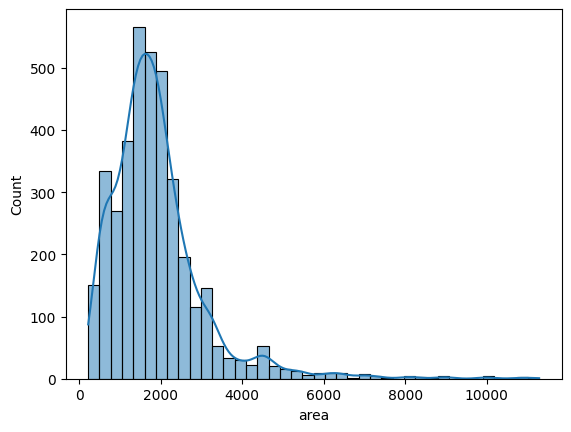

In [ ]:
sns.histplot(df['area'],kde=True,bins=40)

In [ ]:
fig = px.histogram(df['area'],nbins=40,marginal='rug')
fig.update_layout(bargap=0.05)

In [ ]:
fig = px.box(df['area'],orientation='h')
fig.show()

In [ ]:
df.shape

(3808, 23)

In [ ]:
df.sort_values(by='area',ascending=True).head(15).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
920,house,independent,sector 7,0.27,12000.000000,225.0,plot area 225(20.9 sq.m.),2,NaN,225.0,NaN
565,flat,ansal api sushant estate,sector 52,0.29,11600.000000,250.0,carpet area: 250 (23.23 sq.m.),1,NaN,NaN,250.0
2766,house,my home,sector 2,0.34,12592.000000,270.0,plot area 270(25.08 sq.m.),2,NaN,270.0,NaN
739,house,independent,sohna road,0.07,2525.000000,277.0,plot area 33(27.59 sq.m.),1,NaN,297.0,NaN
1355,house,independent,sector 9,0.22,7407.000000,297.0,carpet area: 33 (27.59 sq.m.),2,NaN,NaN,297.0
1224,flat,lig flat,sector 40,1.50,50000.000000,300.0,built up area: 300 (27.87 sq.m.),1,NaN,300.0,NaN
2206,flat,zara aavaas,sector 104,0.22,7302.000000,301.0,carpet area: 301.28 (27.99 sq.m.),1,NaN,NaN,302.0
2279,flat,zara aavaas,sector 104,0.20,6645.000000,301.0,built up area: 301 (27.96 sq.m.),1,NaN,301.0,NaN
1020,flat,zara aavaas,sector 104,0.20,6644.000000,301.0,carpet area: 301 (27.96 sq.m.),1,NaN,NaN,301.0
2094,flat,gls avenue 51,sector 92,0.21,6953.000000,302.0,carpet area: 302 (28.06 sq.m.),1,NaN,NaN,302.0


In [ ]:
df.drop(index=[795,2662],inplace=True)

In [ ]:
df_irr5 = df.sort_values(by='area',ascending=False).head(15).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

In [ ]:
df_irr5

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
1922,house,unitech aspen greens,sector 50,6.95,4490.0000,15479.0,plot area 240(200.67 sq.m.)built up area: 2160(1806.04 sq.m.)carpet area: 1720(1438.14 sq.m.),3,NaN,2160.0,15475.0
3383,house,independent,sector 43,27.50,24366.0000,11286.0,plot area 1254(1048.5 sq.m.),6,NaN,11282.0,NaN
400,flat,m3m golfestate,sector 65,13.20,12000.0000,11000.0,carpet area: 11000 (1021.93 sq.m.),4,NaN,NaN,10996.0
472,house,independent,sector 50,5.00,4593.0553,10886.0,plot area 2(1011.71 sq.m.),6,NaN,10886.0,NaN
3580,house,independent,sohna road,5.50,5093.0000,10799.0,plot area 1200(1003.35 sq.m.)built up area: 3500(2926.45 sq.m.),3,NaN,10797.0,NaN
871,flat,krrish provence estate,sector 2,7.50,7500.0000,10000.0,super built up area 10000(929.03 sq.m.),5,9997.0,NaN,NaN
3408,house,independent,sector 26,18.25,18250.0000,10000.0,plot area 550(51.1 sq.m.)carpet area: 10000(929.03 sq.m.),7,NaN,10000.0,9997.0
1424,flat,the penthouses at the hibiscus,sector 50,8.50,8500.0000,10000.0,carpet area: 10000 (929.03 sq.m.),4,NaN,NaN,9997.0
3339,house,independent,sector 25,8.00,8000.0000,10000.0,carpet area: 10000 (929.03 sq.m.),3,NaN,NaN,9997.0
3376,house,independent,sohna road,6.25,6944.0000,9001.0,plot area 1000(836.13 sq.m.),3,NaN,8997.0,NaN


In [ ]:
df_irr5.loc[1922,['price','price_per_sqft','area']]

price                6.95
price_per_sqft     4490.0
area              15479.0
Name: 1922, dtype: object

In [ ]:
df_irr5.loc[1922,'area'] = 2160

In [ ]:
df_irr5.loc[1922,'carpet_area'] = 1720

In [ ]:
df_irr5.loc[1922,'price_per_sqft'] = (df_irr5.loc[1922,'price']*10000000)/df_irr5.loc[1922,'area']

In [ ]:
df.sort_values(by='area',ascending=False).head(15).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
1922,house,unitech aspen greens,sector 50,6.95,4490.0000,15479.0,plot area 240(200.67 sq.m.)built up area: 2160(1806.04 sq.m.)carpet area: 1720(1438.14 sq.m.),3,NaN,2160.0,15475.0
3383,house,independent,sector 43,27.50,24366.0000,11286.0,plot area 1254(1048.5 sq.m.),6,NaN,11282.0,NaN
400,flat,m3m golfestate,sector 65,13.20,12000.0000,11000.0,carpet area: 11000 (1021.93 sq.m.),4,NaN,NaN,10996.0
472,house,independent,sector 50,5.00,4593.0553,10886.0,plot area 2(1011.71 sq.m.),6,NaN,10886.0,NaN
3580,house,independent,sohna road,5.50,5093.0000,10799.0,plot area 1200(1003.35 sq.m.)built up area: 3500(2926.45 sq.m.),3,NaN,10797.0,NaN
871,flat,krrish provence estate,sector 2,7.50,7500.0000,10000.0,super built up area 10000(929.03 sq.m.),5,9997.0,NaN,NaN
3408,house,independent,sector 26,18.25,18250.0000,10000.0,plot area 550(51.1 sq.m.)carpet area: 10000(929.03 sq.m.),7,NaN,10000.0,9997.0
1424,flat,the penthouses at the hibiscus,sector 50,8.50,8500.0000,10000.0,carpet area: 10000 (929.03 sq.m.),4,NaN,NaN,9997.0
3339,house,independent,sector 25,8.00,8000.0000,10000.0,carpet area: 10000 (929.03 sq.m.),3,NaN,NaN,9997.0
3376,house,independent,sohna road,6.25,6944.0000,9001.0,plot area 1000(836.13 sq.m.),3,NaN,8997.0,NaN


In [ ]:
df.update(df_irr5)

In [ ]:
df.iloc[[818, 1796, 1123, 2, 2356, 115, 3649, 2503, 1471],:]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_builtup_area,builtup_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
819,flat,adani m2k oyster grande,sector 102,4.55,10000.0,4550.0,super built up area 4650(432 sq.m.)built up area: 4630(430.14 sq.m.)carpet area: 4550(422.71 sq.m.),4,4,3+,11.0,North-East,Relatively New,4649.0,4629.0,4549.0,0,0,0,0,0,1,60
1797,house,international city by sobha phase 1,sector 109,6.00,24691.0,2430.0,plot area 270(225.75 sq.m.),4,5,3+,2.0,North,Relatively New,NaN,2430.0,NaN,0,1,0,0,0,1,96
1124,house,tata primanti,sector 72,8.50,13492.0,6300.0,plot area 6300(585.29 sq.m.),5,6,3+,10.0,East,Relatively New,NaN,6298.0,NaN,1,1,1,1,0,1,145
2,flat,experion the heartsong,sector 108,2.28,8204.0,2779.0,super built up area 2779(258.18 sq.m.),4,5,3+,8.0,North,Relatively New,2779.0,NaN,NaN,0,0,0,0,0,0,101
2357,flat,hcbs sports ville,sohna road,0.29,5587.0,519.0,carpet area: 519 (48.22 sq.m.),2,2,1,4.0,not available,Relatively New,NaN,NaN,519.0,0,0,0,0,0,0,44
115,flat,puri emerald bay,sector 104,2.49,10163.0,2450.0,super built up area 2450(227.61 sq.m.),3,3,3+,14.0,South,Relatively New,2450.0,NaN,NaN,0,1,0,0,0,1,129
3651,flat,pivotal devaan,sector 84,0.35,6003.0,583.0,super built up area 583(54.16 sq.m.),2,2,1,4.0,East,Relatively New,583.0,NaN,NaN,0,0,0,0,0,0,37
2504,flat,gls avenue 51,sector 92,0.42,7106.0,591.0,carpet area: 591 (54.91 sq.m.),2,2,1,4.0,East,Relatively New,NaN,NaN,591.0,1,0,0,1,0,1,42
1472,flat,experion the heartsong,sector 108,0.87,11845.0,734.0,super built up area 1283(119.19 sq.m.)built up area: 978.23(90.88 sq.m.)carpet area: 734.43(68.23 sq.m.),2,3,3,2.0,South-West,Relatively New,1283.0,978.0,735.0,0,1,0,0,0,1,123


In [ ]:
df['area'].describe()

count     3806.000000
mean      1900.857847
std       1179.528370
min        225.000000
25%       1211.000000
50%       1723.000000
75%       2294.000000
max      11286.000000
Name: area, dtype: float64

In [ ]:
from pathlib import Path

In [ ]:
filepath = Path('/content/drive/MyDrive/Capstone_Project_REAL_ESTATE/gurgaon_real_estate_temp_outlier_latest.csv')

In [ ]:
df.to_csv(filepath,index=False)

In [ ]:
# outliers in bedroom

<Axes: xlabel='bedRoom', ylabel='Count'>

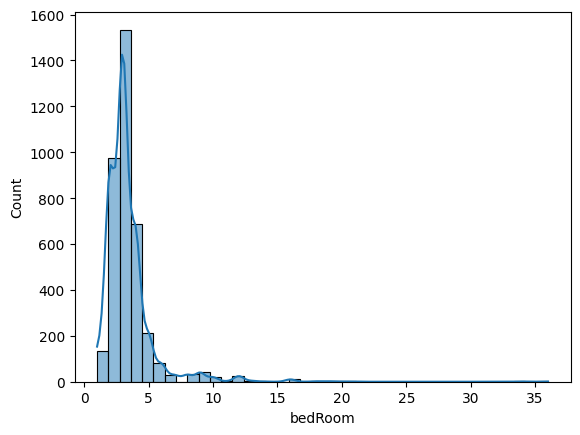

In [ ]:
sns.histplot(df['bedRoom'],kde=True,bins=40)

In [ ]:
fig = px.box(df['bedRoom'],orientation='h')
fig.show()

In [ ]:
df.sort_values(by='bedRoom',ascending=False).head(15).iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_builtup_area,builtup_area,carpet_area,study room,servant room,store room,pooja room,others
2599,house,independent,sector 13,2.25,6944.0,3240.0,plot area 360(301.01 sq.m.),36,36,2,3.0,East,Moderately Old,NaN,3239.0,NaN,0,1,0,0,0
680,house,manohar nagar,sector 8,5.60,12444.0,4500.0,plot area 500(418.06 sq.m.)built up area: 500(418.06 sq.m.),34,34,3+,4.0,not available,New Property,NaN,4499.0,NaN,0,0,0,0,0
1607,house,independent,sector 54,5.00,43066.0,1161.0,plot area 129(107.86 sq.m.),21,21,3+,5.0,North,Relatively New,NaN,1161.0,NaN,0,1,0,0,0
2611,house,independent,sector 43,4.50,39062.0,1152.0,plot area 128(107.02 sq.m.),20,20,3+,4.0,East,Relatively New,NaN,1152.0,NaN,0,1,0,0,0
1836,house,independent,sector 17,3.93,24214.0,1623.0,plot area 1623(150.78 sq.m.)built up area: 1622(150.69 sq.m.),19,17,3,4.0,North-West,Relatively New,NaN,1623.0,NaN,1,1,1,1,0
174,house,independent,sector 17,3.87,5160.0,7500.0,plot area 1623(150.78 sq.m.)built up area: 7500(696.77 sq.m.),19,17,3+,5.0,North-West,Relatively New,NaN,1623.0,NaN,1,0,1,0,0
2891,house,independent,sector 54,5.50,38194.0,1440.0,plot area 160(133.78 sq.m.),18,18,3+,4.0,South-West,Relatively New,NaN,1440.0,NaN,0,1,0,0,0
1510,house,private house,sector 55,7.05,46906.0,1503.0,plot area 167(139.63 sq.m.),18,18,3+,4.0,North-East,Relatively New,NaN,1503.0,NaN,0,0,0,0,1
2065,house,independent,sector 56,12.39,45889.0,2700.0,plot area 300(250.84 sq.m.),16,18,3+,4.0,North-East,New Property,NaN,2700.0,NaN,0,1,0,1,0
1596,house,independent,sector 26,26.00,82540.0,3150.0,plot area 402(336.12 sq.m.)built up area: 400(334.45 sq.m.)carpet area: 350(292.64 sq.m.),16,16,3+,4.0,North-West,New Property,NaN,3617.0,3149.0,1,1,1,1,0


In [ ]:
df['bedRoom'].describe()

count    3806.000000
mean        3.370205
std         2.014232
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max        36.000000
Name: bedRoom, dtype: float64

In [ ]:
df = df[df['bedRoom'] <= 10]

In [ ]:
df['bedRoom'].describe()

count    3753.000000
mean        3.211831
std         1.411062
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max        10.000000
Name: bedRoom, dtype: float64

In [ ]:
#outliers on bathroom

<Axes: xlabel='bathroom', ylabel='Count'>

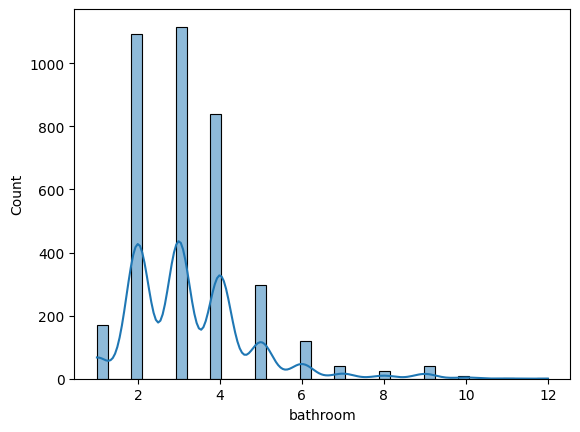

In [ ]:
sns.histplot(df['bathroom'],kde=True,bins=40)

In [ ]:
df['bathroom'].describe()

count    3753.000000
mean        3.258460
std         1.460687
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max        12.000000
Name: bathroom, dtype: float64

In [ ]:
fig = px.box(df['bathroom'],orientation='h')
fig.show()

In [ ]:
#outliers on superbuilt

<Axes: xlabel='super_builtup_area', ylabel='Count'>

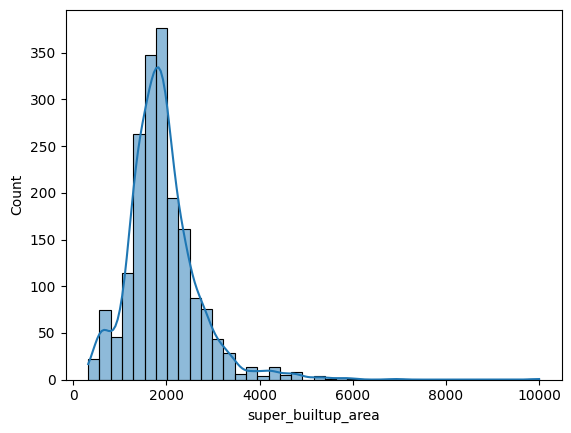

In [ ]:
sns.histplot(df['super_builtup_area'],kde=True,bins=40)

In [ ]:
fig = px.box(df['super_builtup_area'],orientation='h')
fig.show()

In [ ]:
df['super_builtup_area'].describe()

count    1893.000000
mean     1924.752985
std       760.139031
min       325.000000
25%      1479.000000
50%      1828.000000
75%      2215.000000
max      9997.000000
Name: super_builtup_area, dtype: float64

In [ ]:
df.sort_values(by='super_builtup_area',ascending=False).head(15).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
871,flat,krrish provence estate,sector 2,7.50,7500.0,10000.0,super built up area 10000(929.03 sq.m.),5,9997.0,NaN,NaN
414,flat,bestech park view grand spa,sector 81,4.70,6786.0,6926.0,super built up area 6926(643.45 sq.m.),4,6924.0,NaN,NaN
3657,flat,.,sector 2,7.00,11000.0,6364.0,super built up area 6000(557.42 sq.m.),4,5998.0,NaN,NaN
2521,flat,krrish provence estate,sector 2,5.50,9482.0,5800.0,super built up area 5800(538.84 sq.m.),4,5798.0,NaN,NaN
2284,flat,krrish provence estate,sector 2,5.25,9051.0,5800.0,super built up area 5800(538.84 sq.m.),4,5798.0,NaN,NaN
3601,flat,pioneer araya,sector 62,10.75,19500.0,5513.0,super built up area 5514(512.27 sq.m.),5,5513.0,NaN,NaN
203,flat,paras quartier,sector 2,5.90,11028.0,5350.0,super built up area 5350(497.03 sq.m.),4,5349.0,NaN,NaN
867,flat,paras quartier,sector 2,7.50,14018.0,5350.0,super built up area 5350(497.03 sq.m.),4,5349.0,NaN,NaN
572,flat,raheja vedas,sector 108,2.15,4134.0,5201.0,super built up area 5200(483.1 sq.m.)built up area: 4600(427.35 sq.m.)carpet area: 4000(371.61 sq.m.),3,5199.0,4599.0,3999.0
545,flat,beverley park 1,sector 43,8.44,16230.0,5200.0,super built up area 5200(483.1 sq.m.)built up area: 5000(464.52 sq.m.)carpet area: 4900(455.22 sq.m.),4,5199.0,4999.0,4899.0


In [ ]:
df_1 = df.sort_values(by='super_builtup_area',ascending=False).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

In [ ]:
df_1.head(2)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
871,flat,krrish provence estate,sector 2,7.5,7500.0,10000.0,super built up area 10000(929.03 sq.m.),5,9997.0,NaN,NaN
414,flat,bestech park view grand spa,sector 81,4.7,6786.0,6926.0,super built up area 6926(643.45 sq.m.),4,6924.0,NaN,NaN


In [ ]:
df_1[df_1['super_builtup_area'].isnull()][['area','areaWithType','builtup_area','carpet_area']]

,area,areaWithType,builtup_area,carpet_area
5,1440.000,built up area: 160 (14.86 sq.m.),160.0000,NaN
6,1630.000,built up area: 1630 (151.43 sq.m.)carpet area: 1625(150.97 sq.m.),1630.0000,1625.000
8,2844.000,plot area 316(264.22 sq.m.),2844.0000,NaN
9,1750.000,carpet area: 1750 (162.58 sq.m.),NaN,1750.000
10,6001.000,plot area 6000(557.42 sq.m.),5998.0000,NaN
12,6000.000,built up area: 6000 (557.42 sq.m.),5998.0000,NaN
13,1582.000,carpet area: 124,NaN,124.000
14,1494.000,plot area 166(138.8 sq.m.),1494.0000,NaN
15,1800.000,carpet area: 1800 (167.23 sq.m.),NaN,1800.000
19,747.000,plot area 83(7.71 sq.m.)built up area: 84(7.8 sq.m.)carpet area: 82(7.62 sq.m.),83.0000,82.000


In [ ]:
df_err = df.loc[[5,13,19,60,138,148,153,301,356,375,438,538,555,565,575,577,578,600,627,825,911,823,967,1061,1205,1345,1539,1623,1805,1812,1816,1821,2037,2130,2153,2245,2308,3103,3218,3308,3372,3377,3688],['area','areaWithType','builtup_area','carpet_area']]

In [ ]:
df_err[df_err['builtup_area'].isnull()]['carpet_area'].index

Index([13, 153, 438, 538, 565, 575, 627, 825, 823, 1205, 1816, 1821, 3372], dtype='int64')

In [ ]:
df_err.loc[[13, 153, 538, 575, 825, 823, 1205, 1816, 1821, 3372],'carpet_area'] = df_err.loc[[13, 153, 538, 575, 825, 823, 1205, 1816, 1821, 3372],'carpet_area']*9

In [ ]:
df_err[df_err['builtup_area'].isnull()]

,area,areaWithType,builtup_area,carpet_area
13,1582.00,carpet area: 124,NaN,1116.00
153,832.00,carpet area: 77.31,NaN,702.00
438,344.26,carpet area: 34401 (3195.96 sq.m.),NaN,343.89
538,820.00,carpet area: 76.44,NaN,693.00
565,250.00,carpet area: 250 (23.23 sq.m.),NaN,250.00
575,1370.00,carpet area: 127.3,NaN,1152.00
627,366.00,carpet area: 366.08 (34.01 sq.m.),NaN,366.00
825,648.00,carpet area: 72 (6.69 sq.m.),NaN,648.00
823,2300.00,super built up area 2300(213.68 sq.m.),NaN,NaN
1205,995.00,carpet area: 92.44,NaN,837.00


In [ ]:
# builtup area 5,138,577,578,911,967,1061,1345,1539,1623,1805,2037,2130,2153,2245,2308,3103,3218,3308,3377,3688
df_err.loc[[5,138,577,578,911,967,1061,1345,1539,1623,1805,2037,2130,2153,2245,2308,3103,3218,3308,3377,3688],'builtup_area'] = df_err.loc[[5,138,577,578,911,967,1061,1345,1539,1623,1805,2037,2130,2153,2245,2308,3103,3218,3308,3377,3688],'builtup_area']*9

# builtup & carpet 19,60
df_err.loc[[19,60],'builtup_area'] = df_err.loc[[19,60],'builtup_area']*9
df_err.loc[[19,60],'carpet_area'] = df_err.loc[[19,60],'carpet_area']*9

# 1386.00 	plot area 154(14.31 sq.m.)carpet area: 1650(153.29 sq.m.) 	154.0->1650 	1650.00->1386



#3500.00 	plot area 272(25.27 sq.m.)built up area: 4800(445.93 sq.m.)carpet area: 3500(325.16 sq.m.) 	272.0->4800 	3499.00

#864.00 	plot area 80(7.43 sq.m.)built up area: 795(73.86 sq.m.)carpet area: 720(66.89 sq.m.) 	80.0->795 	720.00

In [ ]:
#3500.00 	plot area 272(25.27 sq.m.)built up area: 4800(445.93 sq.m.)carpet area: 3500(325.16 sq.m.) 	272.0->4800 	3499.00
df_err.loc[148,'builtup_area'] = 4800


In [ ]:
# 1386.00 	plot area 154(14.31 sq.m.)carpet area: 1650(153.29 sq.m.) 	154.0->1650 	1650.00->1386

df_err.loc[301,'builtup_area'] = 1650
df_err.loc[301,'carpet_area'] = 1386

In [ ]:

#864.00 	plot area 80(7.43 sq.m.)built up area: 795(73.86 sq.m.)carpet area: 720(66.89 sq.m.) 	80.0->795 	720.00

df_err.loc[356,'builtup_area'] = 538
df_err.loc[375,'builtup_area'] = 795

In [ ]:
df_err.loc[2153,'carpet_area'] = 450

In [ ]:
df_err

,area,areaWithType,builtup_area,carpet_area
5,1440.00,built up area: 160 (14.86 sq.m.),1440.0,NaN
13,1582.00,carpet area: 124,NaN,1116.00
19,747.00,plot area 83(7.71 sq.m.)built up area: 84(7.8 sq.m.)carpet area: 82(7.62 sq.m.),747.0,738.00
60,1557.00,plot area 173(16.07 sq.m.)built up area: 160(14.86 sq.m.)carpet area: 150(13.94 sq.m.),1557.0,1350.00
138,900.00,plot area 100(9.29 sq.m.),900.0,NaN
148,3500.00,plot area 272(25.27 sq.m.)built up area: 4800(445.93 sq.m.)carpet area: 3500(325.16 sq.m.),4800.0,3499.00
153,832.00,carpet area: 77.31,NaN,702.00
301,1386.00,plot area 154(14.31 sq.m.)carpet area: 1650(153.29 sq.m.),1650.0,1386.00
356,538.00,plot area 50,538.0,NaN
375,864.00,plot area 80(7.43 sq.m.)built up area: 795(73.86 sq.m.)carpet area: 720(66.89 sq.m.),795.0,720.00


In [ ]:
df.update(df_err)

In [ ]:
#outliers on superbuilt

<Axes: xlabel='builtup_area', ylabel='Count'>

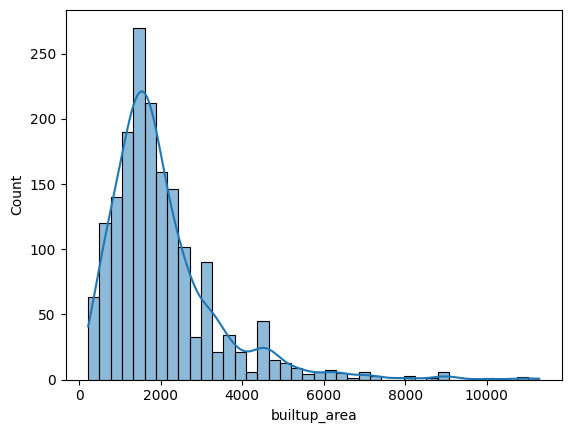

In [86]:
sns.histplot(df['builtup_area'],kde=True,bins=40)

In [85]:
fig = px.box(df['builtup_area'],orientation='h')
fig.show()

In [ ]:
df['builtup_area'].describe()

count     1737.000000
mean      1978.458770
std       1337.698081
min         60.000000
25%       1185.000000
50%       1700.000000
75%       2400.000000
max      11282.000000
Name: builtup_area, dtype: float64

In [ ]:
df[df['builtup_area'] == 60]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_builtup_area,builtup_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score


In [ ]:
df.drop(index=[895,1047],inplace=True)

KeyError: '[895, 1047] not found in axis'

In [8]:
df['builtup_area'].describe()

count     1735.000000
mean      1980.993017
std       1336.486723
min         76.000000
25%       1186.000000
50%       1700.000000
75%       2400.000000
max      11282.000000
Name: builtup_area, dtype: float64

In [7]:
df[df['builtup_area'] == 70]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_builtup_area,builtup_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score


In [6]:
df.loc[3516,'builtup_area'] = 630

In [ ]:
# exported to csv gurgaon_real_estate_temp_outlier_latest.csv

In [4]:
df = pd.read_csv('/content/drive/MyDrive/Capstone_Project_REAL_ESTATE/gurgaon_real_estate_temp_outlier_latest.csv').drop_duplicates()

In [27]:
df_builtarea = df.sort_values(by='builtup_area',ascending=True).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

In [24]:
df_cor1 = df_builtarea[abs(df_builtarea['area'] - df_builtarea['builtup_area']) > 100].head(16)

In [25]:
df_cor1['builtup_area'] = df_cor1['builtup_area']*9

In [26]:
df_cor1

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
3534,house,independent,sector 4,0.67,9795.321637,684.0,plot area 76(7.06 sq.m.),3,NaN,684.0,NaN
1671,house,mahavir pura,sector 45,0.75,8333.333333,900.0,plot area 100(9.29 sq.m.),2,NaN,900.0,NaN
687,house,independent,sector 3,0.90,8928.571429,1008.0,built up area: 112 (10.41 sq.m.),3,NaN,1017.0,NaN
2873,house,independent,sector 7,1.00,8818.342152,1134.0,plot area 126(11.71 sq.m.),2,NaN,1134.0,NaN
811,house,independent,sector 3,0.75,6410.256410,1170.0,built up area: 130 (12.08 sq.m.),2,NaN,1170.0,NaN
538,house,independent,sector 12,1.00,8230.452675,1215.0,plot area 135(12.54 sq.m.)built up area: 3750(348.39 sq.m.),9,NaN,1215.0,NaN
1275,house,not applicable,sector 4,0.80,6088.280061,1314.0,plot area 146(13.56 sq.m.),5,NaN,1314.0,NaN
1163,house,independent,sector 54,3.75,26041.666667,1440.0,plot area 160(14.86 sq.m.),4,NaN,1440.0,NaN
759,house,independent,sector 9,1.10,6111.111111,1800.0,plot area 200(18.58 sq.m.),4,NaN,1800.0,NaN
1231,house,independent,sector 6,1.00,4629.629630,2160.0,built up area: 240 (22.3 sq.m.),6,NaN,2160.0,NaN


In [29]:
df.update(df_cor1)

In [33]:
df.sort_values(by='builtup_area',ascending=True).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
909,house,independent,sector 7,0.27,12000.000000,225.000,plot area 225(20.9 sq.m.),2,NaN,225.0000,NaN
2724,house,my home,sector 2,0.34,12592.000000,270.000,plot area 270(25.08 sq.m.),2,NaN,270.0000,NaN
730,house,independent,sohna road,0.07,2525.000000,277.000,plot area 33(27.59 sq.m.),1,NaN,297.0000,NaN
1211,flat,lig flat,sector 40,1.50,50000.000000,300.000,built up area: 300 (27.87 sq.m.),1,NaN,300.0000,NaN
2247,flat,zara aavaas,sector 104,0.20,6645.000000,301.000,built up area: 301 (27.96 sq.m.),1,NaN,301.0000,NaN
3285,flat,zara aavaas,sector 104,0.26,7807.000000,333.000,built up area: 301 (27.96 sq.m.),1,NaN,301.0000,NaN
1352,flat,signature global solera,sector 107,0.25,7862.000000,318.000,built up area: 318 (29.54 sq.m.),1,NaN,318.0000,NaN
1196,house,independent,sector 7,1.35,40909.000000,330.000,built up area: 330 (30.66 sq.m.),4,NaN,330.0000,NaN
700,house,independent,sector 39,7.00,10000.000000,7000.000,plot area 350(32.52 sq.m.)built up area: 7000(650.32 sq.m.),10,NaN,350.0000,NaN
3364,house,unitech deerwood chase,sector 50,8.45,26152.893841,3231.000,plot area 359(33.35 sq.m.),3,NaN,359.0000,NaN


In [31]:
df.loc[3744,['builtup_area','carpet_area']] = df.loc[3744,['builtup_area','carpet_area']]*9

builtup_area    3123.0
carpet_area     1935.0
Name: 3744, dtype: object

In [37]:
df_cor2 = df.sort_values(by='builtup_area',ascending=True).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]][abs(df_builtarea['area'] - df_builtarea['builtup_area']) > 400]

<ipython-input-37-26a3612dd2b4>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_cor2 = df.sort_values(by='builtup_area',ascending=True).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]][abs(df_builtarea['area'] - df_builtarea['builtup_area']) > 400]


In [42]:
df_cor2 = df_cor2.head(14)

In [44]:
df_cor2['builtup_area'] = df_cor2['builtup_area']*9

<ipython-input-44-7dba2a435ff8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cor2['builtup_area'] = df_cor2['builtup_area']*9


In [47]:
df.update(df_cor2)

In [63]:
df[abs(df_builtarea['area'] - df_builtarea['builtup_area']) > 100].sort_values(by='builtup_area',ascending=True).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

<ipython-input-63-46f9a2db568a>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[abs(df_builtarea['area'] - df_builtarea['builtup_area']) > 100].sort_values(by='builtup_area',ascending=True).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]


,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
55,flat,signature the roselia,sector 95,0.41,7293.000000,562.0,built up area: 670 (62.25 sq.m.)carpet area: 569(52.86 sq.m.),2,NaN,670.0000,569.0
3534,house,independent,sector 4,0.67,9795.321637,684.0,plot area 76(7.06 sq.m.),3,NaN,684.0000,NaN
378,flat,breez global heights,sohna road,0.39,4105.000000,950.0,super built up area 950(88.26 sq.m.)built up area: 720(66.89 sq.m.)carpet area: 610(56.67 sq.m.),2,950.0,720.0000,610.0
2616,flat,shri balaji apartment,sector 12,0.35,4037.000000,867.0,super built up area 867(80.55 sq.m.)built up area: 737(68.47 sq.m.)carpet area: 650(60.39 sq.m.),2,867.0,737.0000,650.0
2974,flat,breez global heights,sohna road,0.46,4842.000000,950.0,super built up area 950(88.26 sq.m.)built up area: 800(74.32 sq.m.)carpet area: 700(65.03 sq.m.),2,950.0,800.0000,700.0
660,flat,vatika gurgaon,sector 83,0.78,6265.000000,1245.0,super built up area 1245(115.66 sq.m.)built up area: 850(78.97 sq.m.)carpet area: 790(73.39 sq.m.),2,1245.0,850.0000,790.0
3634,flat,signature global solera,sector 107,0.50,4761.000000,1050.0,super built up area 1050(97.55 sq.m.)built up area: 850(78.97 sq.m.)carpet area: 645(59.92 sq.m.),3,1050.0,850.0000,645.0
1671,house,mahavir pura,sector 45,0.75,8333.333333,900.0,plot area 100(9.29 sq.m.),2,NaN,900.0000,NaN
1034,flat,paras dews,sector 106,0.95,6859.000000,1385.0,super built up area 1385(128.67 sq.m.)built up area: 940(87.33 sq.m.)carpet area: 845(78.5 sq.m.),2,1385.0,940.0000,845.0
3546,flat,paras dews,sector 110,0.88,6353.000000,1385.0,super built up area 1385(128.67 sq.m.)built up area: 940(87.33 sq.m.)carpet area: 845(78.5 sq.m.),2,1385.0,940.0000,845.0


In [53]:
df.loc[[890,2505,2867],'builtup_area']*=9

In [54]:
df.loc[[890,2505,2867],'builtup_area']

890     6300.0
2505    6786.0
2867    8100.0
Name: builtup_area, dtype: float64

In [57]:
df.loc[229,'builtup_area'] = 7362

In [61]:
df.loc[1841,'builtup_area'] = 3660

In [ ]:
#outliers on carpet area

<Axes: xlabel='carpet_area', ylabel='Count'>

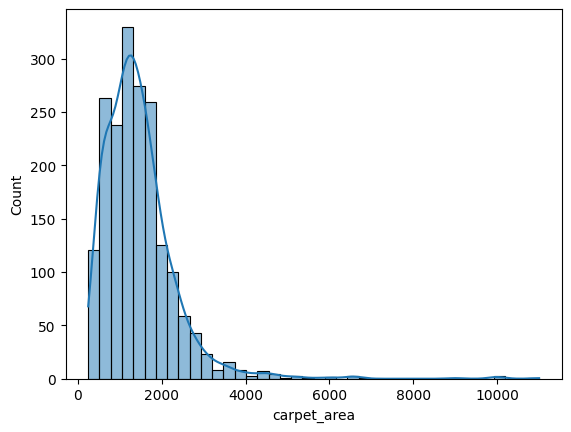

In [82]:
sns.histplot(df['carpet_area'],kde=True,bins=40)

In [83]:
fig = px.box(df['carpet_area'],orientation='h')
fig.show()

In [84]:
df['carpet_area'].describe()

count     1897.000000
mean      1463.456786
std        909.799662
min        250.000000
25%        900.000000
50%       1320.000000
75%       1800.000000
max      10996.000000
Name: carpet_area, dtype: float64

In [75]:
df.sort_values(by='carpet_area',ascending=False).iloc[:,[0,1,2,3,4,5,6,7,13,14,15]]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,super_builtup_area,builtup_area,carpet_area
395,flat,m3m golfestate,sector 65,13.20,12000.000000,11000.000,carpet area: 11000 (1021.93 sq.m.),4,NaN,NaN,10996.000
1406,flat,the penthouses at the hibiscus,sector 50,8.50,8500.000000,10000.000,carpet area: 10000 (929.03 sq.m.),4,NaN,NaN,9997.000
3289,house,independent,sector 25,8.00,8000.000000,10000.000,carpet area: 10000 (929.03 sq.m.),3,NaN,NaN,9997.000
3358,house,independent,sector 26,18.25,18250.000000,10000.000,plot area 550(51.1 sq.m.)carpet area: 10000(929.03 sq.m.),7,NaN,10000.0000,9997.000
1269,flat,the penthouses at the hibiscus,sector 50,8.00,8888.000000,9001.000,carpet area: 9000 (836.13 sq.m.),4,NaN,NaN,8997.000
2499,flat,central park resorts,sector 48,15.00,22388.000000,6700.000,carpet area: 6700 (622.45 sq.m.),5,NaN,NaN,6698.000
1990,flat,tata gurgaon gateway,sector 113,6.00,9139.000000,6565.000,carpet area: 6565 (609.91 sq.m.),5,NaN,NaN,6563.000
2188,house,dlf city plot phase 4,sector 28,13.00,19920.013484,6526.100,carpet area: 7250 (6061.92 sq.m.),10,NaN,NaN,6522.700
2320,house,ansal sushant lok plots,sector 43,11.50,17692.000000,6500.000,plot area 3762(349.5 sq.m.)built up area: 9000(836.13 sq.m.)carpet area: 6500(603.87 sq.m.),7,NaN,3761.0000,6498.000
685,flat,ats triumph,sector 104,4.45,6846.000000,6500.000,carpet area: 6500 (603.87 sq.m.),4,NaN,NaN,6498.000


In [71]:
df.loc[[3629,932,2888,3428,533,3133],'carpet_area']*=9

In [74]:
df.loc[[575,2361,1172,2480,1636],'carpet_area'] = np.nan

In [76]:
df.duplicated().sum()

0

In [77]:
df.loc[[2320,2637,675,1334,953],'carpet_area'] = np.nan

In [78]:
df.loc[6500,'builtup_area'] = 6500

In [79]:
df.loc[2547,'builtup_area'] = 4650

In [80]:
df.loc[2547,'carpet_area'] = 4500

In [81]:
df.drop(index=2076,inplace=True)

In [5]:
df.head()

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_builtup_area,builtup_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,dlf regal gardens,sector 90,1.26,7403.0,1702.0,super built up area 1702(158.12 sq.m.)carpet area: 1500(139.35 sq.m.),3.0,3.0,3,6.0,North-East,Relatively New,1702.0,NaN,1500.0,0.0,0.0,0.0,0.0,1.0,1.0,28.0
1,flat,tulip violet,sector 69,1.72,8730.0,1970.0,super built up area 1970(183.02 sq.m.),4.0,4.0,1,12.0,North-East,Relatively New,1970.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,86.0
2,flat,experion the heartsong,sector 108,2.28,8204.0,2779.0,super built up area 2779(258.18 sq.m.),4.0,5.0,3+,8.0,North,Relatively New,2779.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,101.0
3,flat,signature global city 92,sector 92,0.78,8047.0,969.0,super built up area 1197(111.2 sq.m.),2.0,2.0,2,2.0,not available,New Property,1197.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,1.0,47.0
4,flat,puri diplomatic greens,sector 111,3.45,11694.0,2950.0,super built up area 2950(274.06 sq.m.),4.0,5.0,3+,10.0,North,Relatively New,2949.0,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,101.0


In [62]:
df_correc = df.sort_values(by='bedRoom',ascending=False).iloc[:,[0,1,2,3,4,5,6,7,8,10,13,14,15]]

In [55]:
df_correc = df_correc[(df_correc['bedRoom'] == 10) & (df_correc['area'] < 5000)]

In [18]:
df.drop(index=[654, 2529, 235, 2394, 3743],inplace=True)

In [24]:
df.drop(index=[572,1376,224],inplace=True)

In [31]:
df.shape

(3739, 23)

In [30]:
df.drop(index=[3455,3487,3745],inplace=True)

In [34]:
df.drop(index=[3376],inplace=True)

In [37]:
df.loc[3328,'bedRoom'] = 4

In [40]:
df.loc[3116,'bedRoom'] = 4

In [60]:
df_correc

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,floorNum,super_builtup_area,builtup_area,carpet_area
2636,house,unitech palms south city 1,sector 41,9.35,28858.000000,3240.0,plot area 3240(301.01 sq.m.)built up area: 7500(696.77 sq.m.)carpet area: 6000(557.42 sq.m.),2.0,2.0,4.0,NaN,3239.0,NaN
3345,house,independent,sector 13,1.50,11538.000000,1300.0,plot area 1300(120.77 sq.m.),2.0,2.0,4.0,NaN,1300.0,NaN
409,house,independent,sector 9,1.25,8735.000000,1431.0,plot area 159(132.94 sq.m.),3.0,2.0,3.0,NaN,1431.0,NaN
1256,house,independent,sector 11,1.35,3857.000000,3500.0,plot area 3500(325.16 sq.m.),3.0,2.0,3.0,NaN,3499.0,NaN
3112,house,hans enclave,sector 33,2.00,10582.000000,1890.0,built up area: 210 (175.59 sq.m.),3.0,3.0,3.0,NaN,1890.0,NaN
3516,house,independent,sector 24,4.50,33333.000000,1350.0,plot area 163(136.29 sq.m.)built up area: 160(133.78 sq.m.)carpet area: 150(125.42 sq.m.),2.0,2.0,4.0,NaN,1467.0,1350.0
1784,house,independent,sector 41,4.25,26235.000000,1620.0,plot area 180(150.5 sq.m.),2.0,2.0,4.0,NaN,1620.0,NaN
2862,house,ganpati heights apartment,sector 13,1.25,12077.294686,1035.0,plot area 115(7692.86 sq.m.),3.0,2.0,3.0,NaN,1035.0,NaN
2652,house,independent,sohna road,0.95,8920.000000,1065.0,plot area 1065(98.94 sq.m.),3.0,3.0,3.0,NaN,1065.0,NaN
3146,house,independent,sector 43,2.10,38251.000000,549.0,plot area 61(51 sq.m.),2.0,2.0,5.0,NaN,549.0,NaN


In [57]:
df_correc['bedRoom'] = round(df_correc['bedRoom']/df_correc['floorNum'])

In [59]:
df_correc['bathroom'] = round(df_correc['bathroom']/df_correc['floorNum'])

In [61]:
df.update(df_correc)

In [116]:
df_cor2 = df.sort_values(by='bedRoom',ascending=False).iloc[:,[0,1,2,3,4,5,6,7,8,10,13,14,15]]

In [65]:
df.drop(index=3749,inplace=True)

In [117]:
df_cor2 = df_cor2[(df_cor2['bedRoom'] == 6)]

In [118]:
df_cor2

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,floorNum,super_builtup_area,builtup_area,carpet_area
2560,house,rwa sector 46,sector 46,4.50,24390.000000,1845.0,plot area 204(170.57 sq.m.)built up area: 206(172.24 sq.m.)carpet area: 205(171.41 sq.m.),6.0,6.0,3.0,NaN,1836.0,1845.0
3031,house,independent,sector 2,4.95,20370.000000,2430.0,plot area 270(225.75 sq.m.),6.0,5.0,3.0,NaN,2430.0,NaN
1641,house,independent,sector 13,0.46,7302.000000,630.0,plot area 70(58.53 sq.m.),6.0,3.0,3.0,NaN,630.0,NaN
3652,house,iffco nagar and 17b rwa,sector 17,2.98,20566.000000,1449.0,plot area 161(134.62 sq.m.),6.0,6.0,3.0,NaN,1449.0,NaN
2563,house,ansal sushant residency,sector 57,4.60,17037.000000,2700.0,plot area 300(250.84 sq.m.),6.0,6.0,3.0,NaN,2700.0,NaN
3139,flat,karmyogi apartment,sector 10,2.30,6467.000000,3557.0,carpet area: 3556 (330.36 sq.m.),6.0,4.0,6.0,NaN,NaN,3555.0
3442,house,uppal southend,sector 49,3.75,25562.000000,1467.0,plot area 163(136.29 sq.m.),6.0,6.0,3.0,NaN,1467.0,NaN
2658,house,independent,sector 25,10.85,38150.000000,2844.0,plot area 316(264.22 sq.m.),6.0,6.0,3.0,NaN,2844.0,NaN
2412,house,independent,sector 38,4.00,21786.000000,1836.0,plot area 204(170.57 sq.m.),6.0,6.0,4.0,NaN,1836.0,NaN
3193,house,independent,sector 6,0.75,10518.000000,713.0,plot area 713(66.24 sq.m.),6.0,4.0,3.0,NaN,713.0,NaN


In [111]:
df_cor2['bedRoom'] = round((df_cor2['bedRoom']/df_cor2['floorNum']) + 0.5)

In [112]:
df_cor2['bathroom'] = round((df_cor2['bathroom']/df_cor2['floorNum']) + 0.5)

In [77]:
df_cor2.loc[646,['bedRoom','bathroom']] = 2

In [114]:
df.update(df_cor2)

In [119]:
df.sort_values(by='bedRoom',ascending=False).iloc[:,[0,1,2,3,4,5,6,7,8,10,13,14,15]]

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,floorNum,super_builtup_area,builtup_area,carpet_area
700,house,independent,sector 39,7.00,10000.000000,7000.000,plot area 350(32.52 sq.m.)built up area: 7000(650.32 sq.m.),10.0,11.0,4.0,NaN,3150.0000,NaN
3277,house,dlf pink town house,sector 24,1.90,3786.000000,5018.000,built up area: 5018 (466.19 sq.m.),10.0,9.0,3.0,NaN,5017.0000,NaN
2187,house,dlf city plot phase 4,sector 28,13.00,19920.013484,6526.100,carpet area: 7250 (6061.92 sq.m.),10.0,10.0,1.0,NaN,NaN,6522.700
2866,house,independent,sector 13,9.00,11111.111111,8100.000,plot area 900(83.61 sq.m.),10.0,5.0,4.0,NaN,8100.0000,NaN
264,house,independent,sector 56,8.00,9654.000000,8287.000,plot area 362(33.63 sq.m.)built up area: 8286(769.79 sq.m.),10.0,10.0,4.0,NaN,3258.0000,NaN
1317,house,adani brahma samsara,sector 60,18.02,28200.000000,6390.000,built up area: 6390 (593.65 sq.m.),9.0,12.0,3.0,NaN,6388.0000,NaN
518,house,independent,sector 25,13.50,19286.000000,7000.000,built up area: 7000 (650.32 sq.m.),9.0,9.0,1.0,NaN,6998.0000,NaN
1181,house,independent,sector 2,5.60,17284.000000,3240.000,plot area 360(301.01 sq.m.),8.0,6.0,NaN,NaN,3239.0000,NaN
2034,house,bhim garh kheri,sector 3,1.50,7576.000000,1980.000,plot area 220(183.95 sq.m.),8.0,2.0,1.0,NaN,1980.0000,NaN
1287,house,independent,sector 24,10.00,25542.784163,3915.000,carpet area: 435 (40.41 sq.m.),8.0,10.0,1.0,NaN,NaN,435.000


In [120]:
from pathlib import Path

filepath = Path('/content/drive/MyDrive/Capstone_Project_REAL_ESTATE/outlier_treated_gurgaon_real_estate.csv')

In [121]:
df.to_csv(filepath,index=False)